In [1]:
import math
import numpy as np
import pandas as pd
import time
import neo4j

import psycopg2

import gmaps
import gmaps.geojson_geometries
import requests 

from geographiclib.geodesic import Geodesic
import matplotlib.pyplot as plt

%matplotlib inline

## Supporting Code

In [2]:
#
# function to run a select query and return rows in a pandas dataframe
# pandas puts all numeric values from postgres to float
# if it will fit in an integer, change it to integer
#
def my_select_query_pandas(query, rollback_before_flag, rollback_after_flag):
    "function to run a select query and return rows in a pandas dataframe"
    
    if rollback_before_flag:
        connection.rollback()
    
    df = pd.read_sql_query(query, connection)
    
    if rollback_after_flag:
        connection.rollback()
    
    # fix the float columns that really should be integers
    
    for column in df:
    
        if df[column].dtype == "float64":

            fraction_flag = False

            for value in df[column].values:
                
                if not np.isnan(value):
                    if value - math.floor(value) != 0:
                        fraction_flag = True

            if not fraction_flag:
                df[column] = df[column].astype('Int64')
    
    return(df)
    

In [3]:
connection = psycopg2.connect(
    user = "postgres",
    password = "ucb",
    host = "postgres",
    port = "5432",
    database = "postgres"
)

In [4]:
cursor = connection.cursor()

In [5]:
f = open('gmap_api_key.txt', 'r')
my_api_key = f.read()
f.close()

gmaps.configure(api_key=my_api_key)

In [6]:
#  Given two points in (latitude, longitude) format, calculate the distance between them in miles
def my_calculate_distance(point_1, point_2):
    "Given two points in (latitude, longitude) format, calculate the distance between them in miles"
    
    geod = Geodesic.WGS84


    g = geod.Inverse(point_1[0], point_1[1], point_2[0], point_2[1])
    miles = g['s12'] / 1000 * 0.621371
    return miles

In [7]:
def find_distance_to_store(lat, long):
    berkeley_store = (37.8555, -122.2604)
    return my_calculate_distance((lat,long), berkeley_store)

In [8]:
def create_stations_list(stations_dict):
    stations_list = []
    
    for station in stations_dict['station']:
        station_name = stations_dict['station'][station]
        station_lat = stations_dict['latitude'][station]
        station_long = stations_dict['longitude'][station]
        stations_list.append((station_name, station_lat, station_long, station))
        
    return stations_list

In [9]:
rollback_before_flag = True
rollback_after_flag = True

query = """

SELECT * from stations

"""

stations = my_select_query_pandas(query, rollback_before_flag, rollback_after_flag)
stations_dict = stations.to_dict()
stations_list = create_stations_list(stations_dict)

In [10]:
def find_closest_station(zip_latitude, zip_longitude):
    zip_latlong = (zip_latitude, zip_longitude)
    dist = []
    
    for station in stations_list:
        station_name = station[0]
        dist_to_station = my_calculate_distance(zip_latlong, (station[1], station[2]))
        dist.append((station_name, dist_to_station))
        
    return sorted(dist, key=lambda item: item[1])[0][0]

In [11]:
def find_closest_station_dist(zip_latitude, zip_longitude, station_name):
    zip_latlong = (zip_latitude, zip_longitude)
    for station in stations_list:
        if station_name == station[0]:
            station_idx = station[-1]
        
    station_latlong = (stations_dict['latitude'][station_idx], stations_dict['longitude'][station_idx])
    return my_calculate_distance(zip_latlong, station_latlong)

In [12]:
def get_address_lat(address):
    print(address)
    api_response = requests.get('https://maps.googleapis.com/maps/api/geocode/json?address={0}&key={1}'.format(address, my_api_key))
    api_response_dict = api_response.json()

    if api_response_dict['status'] == 'OK':
        return api_response_dict['results'][0]['geometry']['location']['lat']

In [13]:
def get_address_long(address):
    api_response = requests.get('https://maps.googleapis.com/maps/api/geocode/json?address={0}&key={1}'.format(address, my_api_key))
    api_response_dict = api_response.json()

    if api_response_dict['status'] == 'OK':
        return api_response_dict['results'][0]['geometry']['location']['lng']

In [14]:
driver = neo4j.GraphDatabase.driver(uri="neo4j://neo4j:7687", auth=("neo4j","w205"))

In [15]:
session = driver.session(database="neo4j")

In [16]:
def my_neo4j_wipe_out_database():
    "wipe out database by deleting all nodes and relationships"
    
    query = "match (node)-[relationship]->() delete node, relationship"
    session.run(query)
    
    query = "match (node) delete node"
    session.run(query)

In [17]:
def my_neo4j_run_query_pandas(query, **kwargs):
    "run a query and return the results in a pandas dataframe"
    
    result = session.run(query, **kwargs)
    
    df = pd.DataFrame([r.values() for r in result], columns=result.keys())
    
    return df

In [18]:
def my_neo4j_number_nodes_relationships():
    "print the number of nodes and relationships"
   
    
    query = """
        match (n) 
        return n.name as node_name, labels(n) as labels
        order by n.name
    """
    
    df = my_neo4j_run_query_pandas(query)
    
    number_nodes = df.shape[0]
    
    
    query = """
        match (n1)-[r]->(n2) 
        return n1.name as node_name_1, labels(n1) as node_1_labels, 
            type(r) as relationship_type, n2.name as node_name_2, labels(n2) as node_2_labels
        order by node_name_1, node_name_2
    """
    
    df = my_neo4j_run_query_pandas(query)
    
    number_relationships = df.shape[0]
    
    print("-------------------------")
    print("  Nodes:", number_nodes)
    print("  Relationships:", number_relationships)
    print("-------------------------")


In [19]:
def my_neo4j_create_station_node(station_name):
    "create a node with label Station"
    
    query = """
    
    CREATE (:Station {name: $station_name})
    
    """
    
    session.run(query, station_name=station_name)
    

In [20]:
def my_neo4j_create_customer_node(customer_id, first, last):
    "create a node with label Customer"
    
    name = first + ' ' + last
    
    query = """
    
    CREATE (:Customer {customer_id: $customer_id, name: $name})
    
    """
    
    session.run(query, customer_id=customer_id, name=name)
    

In [21]:
def my_neo4j_create_station_relationship_one_way(from_station, to_station, weight):
    "create a relationship one way between two stations with a weight"
    
    query = """
    
    MATCH (from:Station), 
          (to:Station)
    WHERE from.name = $from_station and to.name = $to_station
    CREATE (from)-[:LINK {weight: $weight}]->(to)
    
    """
    
    session.run(query, from_station=from_station, to_station=to_station, weight=weight)
    

In [22]:
def my_neo4j_create_customer_relationship_one_way(customer_id, to_station, weight):
    "create a relationship one way between a customer and a stations with a weight"
    
    query = """
    
    MATCH (from:Customer), 
          (to:Station)
    WHERE from.customer_id = $customer_id and to.name = $to_station
    CREATE (from)-[:CLOSEST_TO {weight: $weight}]->(to)
    
    """
    
    session.run(query, customer_id=customer_id, to_station=to_station, weight=weight)
    

In [23]:
def my_neo4j_nodes_relationships():
    "print all the nodes and relationships"
   
    print("-------------------------")
    print("  Nodes:")
    print("-------------------------")
    
    query = """
        match (n) 
        return n.name as node_name, labels(n) as labels
        order by n.name
    """
    
    df = my_neo4j_run_query_pandas(query)
    
    number_nodes = df.shape[0]
    print('num_nodes:',number_nodes)
    
    display(df)
    
    print("-------------------------")
    print("  Relationships:")
    print("-------------------------")
    
    query = """
        match (n1)-[r]->(n2) 
        return n1.name as node_name_1, labels(n1) as node_1_labels, 
            type(r) as relationship_type, n2.name as node_name_2, labels(n2) as node_2_labels, r.weight as dist
        order by node_name_1, node_name_2
    """
    
    df = my_neo4j_run_query_pandas(query)
    
    number_relationships = df.shape[0]
    print('num_rel:',number_relationships)
    
    display(df)
    
    density = (2 * number_relationships) / (number_nodes * (number_nodes - 1))
    
    print("-------------------------")
    print("  Density:", f'{density:.1f}')
    print("-------------------------")
    

## 

## Create a table that only contains customers from CA

In [24]:
connection.rollback()

query = """

drop table if exists CA_customers;

"""

cursor.execute(query)
connection.commit()

### --> Create CA_customers.csv file

In [25]:
connection.rollback()

query = """

create table if not exists CA_customers(
index numeric,
customer_id numeric,
first_name VARCHAR(100),
last_name VARCHAR(100),
street VARCHAR(100),
city VARCHAR(100),
state VARCHAR(100),
zip VARCHAR(100),
closest_store_id numeric,
distance numeric
);

"""

# don't run if the file has already been created
#cursor.execute(query)
#connection.commit()

In [26]:
connection.rollback()

query = """

insert into CA_customers (
select * from customers 
where state = 'CA'

)

"""

# don't run if the file has already been created
#cursor.execute(query)
#connection.commit()

In [27]:
rollback_before_flag = True
rollback_after_flag = True

query = """

select * from CA_customers;

"""

# don't run if the file has already been created
#CA_customers = my_select_query_pandas(query, rollback_before_flag, rollback_after_flag)


In [28]:
# don't run if the file has already been created
#CA_customers['full_address'] = CA_customers['street'] + ', ' + CA_customers['city'] + ', ' + CA_customers['state'] + ' ' + CA_customers['zip']
#CA_customers['latitude'] = CA_customers.apply(lambda x: get_address_lat(x.full_address), axis=1)
#CA_customers['longitude'] = CA_customers.apply(lambda x: get_address_long(x.full_address), axis=1)  
#CA_customers['closest_station'] = CA_customers.apply(lambda x: find_closest_station(float(x.latitude), float(x.longitude)), axis=1)
#CA_customers['distance_to_station'] = CA_customers.apply(lambda x: find_closest_station_dist(float(x.latitude), float(x.longitude), x.closest_station), axis=1)

In [29]:
#CA_customers.to_csv('CA_customers.csv', index=False)

### --> Load data from CA_customers.csv file

In [30]:
connection.rollback()

query = """

create table if not exists CA_customers(
customer_id numeric,
first_name VARCHAR(100),
last_name VARCHAR(100),
street VARCHAR(100),
city VARCHAR(100),
state VARCHAR(100),
zip VARCHAR(100),
closest_store_id numeric,
distance numeric,
full_address VARCHAR(100),
latitude numeric,
longitude numeric,
closest_station VARCHAR(100),
distance_to_station numeric
);

"""

cursor.execute(query)
connection.commit()

In [31]:
# load data from CA_customers.csv
connection.rollback()

query = """

copy CA_customers
from '/user/projects/ucb_mids_w205_project_3/CA_customers.csv' delimiter ',' NULL '' csv header;
"""

cursor.execute(query)

connection.commit()

In [32]:
rollback_before_flag = True
rollback_after_flag = True

query = """

select * from CA_customers;

"""

CA_customers = my_select_query_pandas(query, rollback_before_flag, rollback_after_flag)
CA_customers = CA_customers.rename({'distance':'distance_to_store'}, axis=1)
CA_customers.tail(3)

,customer_id,first_name,last_name,street,city,state,zip,closest_store_id,distance_to_store,full_address,latitude,longitude,closest_station,distance_to_station
8135,8136,Blakeley,Verry,1947 Thackeray Road,San Geronimo,CA,94963,1,25,"1947 Thackeray Road, San Geronimo, CA 94963",38.004648,-122.658827,Richmond,17.335693
8136,8137,Kikelia,Mendus,90777 Heath Crossing,San Geronimo,CA,94963,1,25,"90777 Heath Crossing, San Geronimo, CA 94963",38.004648,-122.658827,Richmond,17.335693
8137,8138,Nelly,Thurlbourne,8969 7th Park,San Geronimo,CA,94963,1,25,"8969 7th Park, San Geronimo, CA 94963",38.004648,-122.658827,Richmond,17.335693


## 

## Find where majority of customers live

In [33]:
# Find all distinct city and zips of customers
# The customers of the Berkeley store live in 144 different cities around California
rollback_before_flag = True
rollback_after_flag = True

query = """

select distinct city, zip from CA_customers;

"""

my_select_query_pandas(query, rollback_before_flag, rollback_after_flag)

,city,zip
0,Danville,94506
1,San Francisco,94109
2,Rodeo,94572
3,Oakland,94610
4,San Francisco,94102
...,...,...
139,San Rafael,94903
140,Ross,94957
141,San Francisco,94129
142,San Ramon,94582


In [34]:
# Find all distinct closest store IDs for CA customers
# All CA customers are closest to the Berkeley store
rollback_before_flag = True
rollback_after_flag = True

query = """

select distinct s.city as store, s.store_id 
from CA_customers c 
join stores s on c.closest_store_id = s.store_id

"""

my_select_query_pandas(query, rollback_before_flag, rollback_after_flag)

,store,store_id
0,Berkeley,1


In [35]:
# Find zip codes where CA customers live
# The CA customers live in 144 different zip codes
rollback_before_flag = True
rollback_after_flag = True

query = """

SELECT zip, count(*) from CA_customers
group by zip
order by count(*) DESC

"""

my_select_query_pandas(query, rollback_before_flag, rollback_after_flag)

,zip,count
0,94602,260
1,94530,258
2,94608,230
3,94803,224
4,94611,204
...,...,...
139,94957,1
140,94565,1
141,94588,1
142,94070,1


Text(0.5, 1.0, 'Where Most Customers Live')

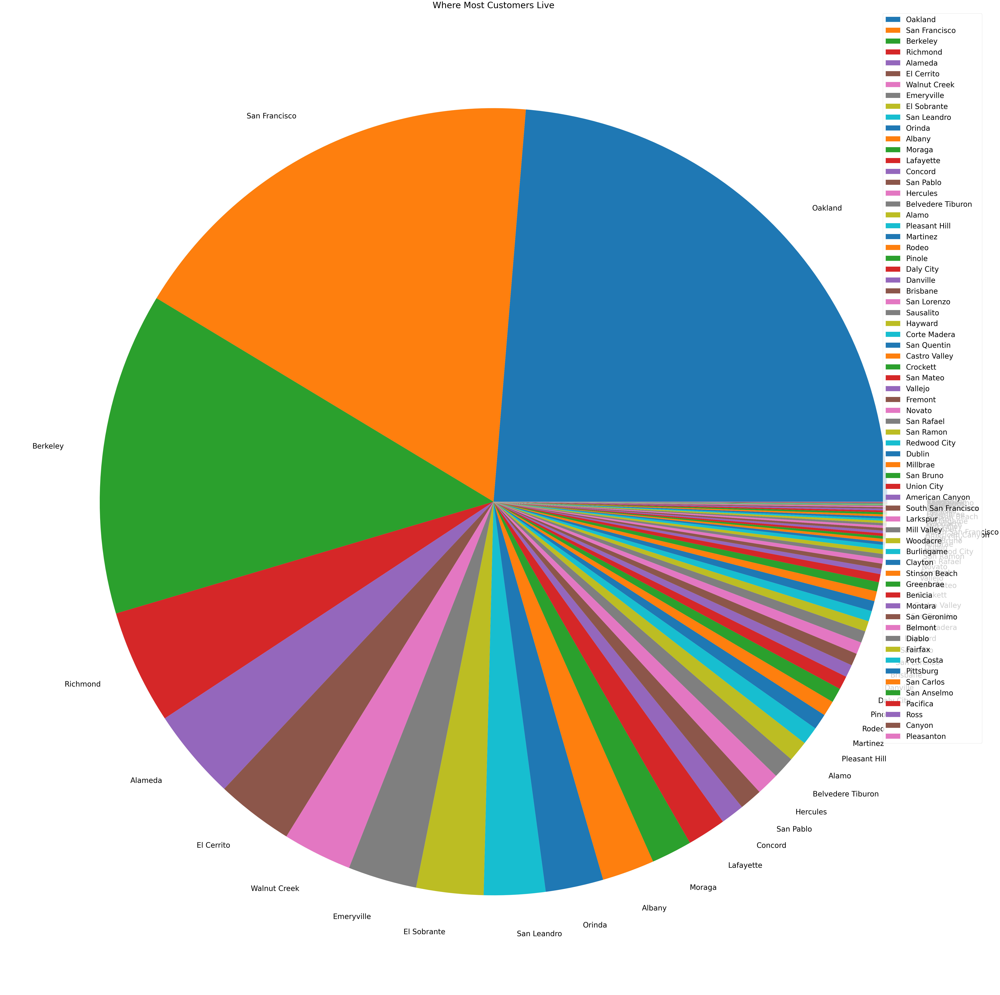

In [36]:
# Find cities where CA customers live
# CA customers live in 66 different unique cities
rollback_before_flag = True
rollback_after_flag = True

query = """

SELECT city, count(*) from CA_customers
group by city
order by count(*) DESC

"""

most_common_cities = my_select_query_pandas(query, rollback_before_flag, rollback_after_flag)
plt.rcParams.update({'font.size': 40})
plt.figure(figsize=(250,100))
plt.pie(x=most_common_cities['count'], labels=most_common_cities['city'])
plt.legend(loc='upper right')
plt.title("Where Most Customers Live")

In [37]:
rollback_before_flag = True
rollback_after_flag = True

query = """

select * from stores where store_id = 1;

"""

berkeley_store = my_select_query_pandas(query, rollback_before_flag, rollback_after_flag)
berkeley_store_latlong = (float(berkeley_store['latitude']), float(berkeley_store['longitude']))
berkeley_store

,store_id,street,city,state,zip,latitude,longitude
0,1,3000 Telegraph Ave,Berkeley,CA,94705,37.8555,-122.2604


In [38]:
CA_cust_locations = CA_customers.loc[:,['latitude','longitude']]
CA_cust_locations.head(3)

,latitude,longitude
0,37.787958,-122.281439
1,37.832117,-122.262553
2,37.832117,-122.262553


In [39]:
CA_cust_locations.isnull().sum()

latitude     5
longitude    6
dtype: int64

In [40]:
# drop records where lat or long is null (small amount)
CA_cust_locations = CA_cust_locations.loc[(CA_cust_locations['latitude'].isnull() == False) & (CA_cust_locations['longitude'].isnull() == False)] 

In [41]:
CA_cust_locations.isnull().sum()

latitude     0
longitude    0
dtype: int64

In [42]:
# Show where Berkeley store is located
info_box_template = """
<dl>
<dt>Store</dt><dd>{city}</dd>
<dt>Latitude</dt><dd>{latitude}</dd>
<dt>Longitude</dt><dd>{longitude}</dd>
</dl>
"""

df_list_dict = berkeley_store.to_dict('records')

store_info = [info_box_template.format(**store) for store in df_list_dict]

df_markers = berkeley_store[['latitude','longitude']]

marker_layer = gmaps.marker_layer(df_markers, info_box_content=store_info)

fig = gmaps.figure(center=berkeley_store_latlong, zoom_level=10)

heatmap_layer = gmaps.heatmap_layer(CA_cust_locations)

fig.add_layer(heatmap_layer)

fig.add_layer(marker_layer)

fig

Figure(layout=FigureLayout(height='420px'))

In [43]:
# show where all stations are located along with the heatmap of the population density of CA customers
info_box_template = """
<dl>
<dt>Station Name</dt><dd>{station}</dd>
<dt>Latitude</dt><dd>{latitude}</dd>
<dt>Longitude</dt><dd>{longitude}</dd>
</dl>
"""

df_list_dict = stations.to_dict('records')

station_info = [info_box_template.format(**station) for station in df_list_dict]

df_markers = stations[['latitude','longitude']]

marker_layer = gmaps.marker_layer(df_markers, info_box_content=station_info)

fig = gmaps.figure(center=berkeley_store_latlong, map_type = 'HYBRID', zoom_level=9.5)

heatmap_layer = gmaps.heatmap_layer(CA_cust_locations)

fig.add_layer(heatmap_layer)

fig.add_layer(marker_layer)

fig

Figure(layout=FigureLayout(height='420px'))

Text(0.5, 1.0, 'Top 20 Cities That Spend The Most')

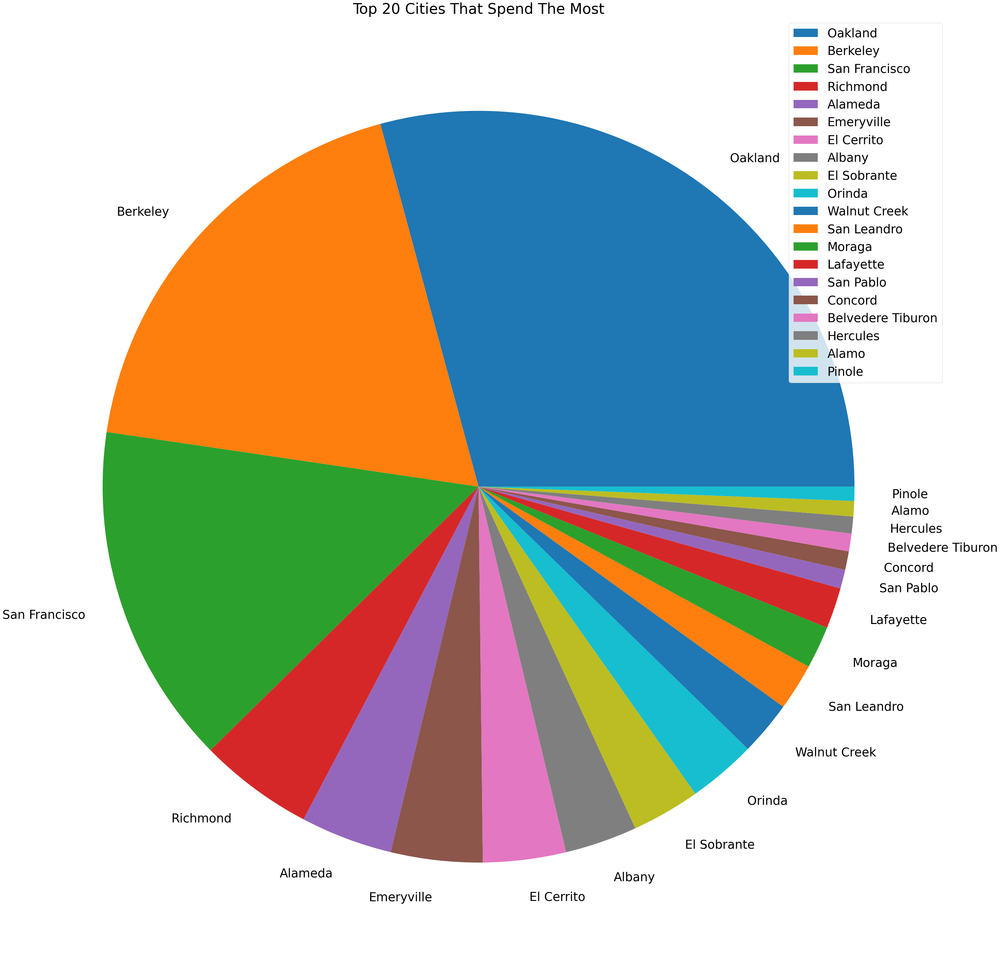

In [44]:
# Find top 20 cities where CA customers spend the most money
rollback_before_flag = True
rollback_after_flag = True

query = """

SELECT city, sum(sales.total_amount) from CA_customers cust
join sales on cust.customer_id = sales.customer_id
group by city
order by sum(sales.total_amount) DESC
limit 20

"""

top_cities = my_select_query_pandas(query, rollback_before_flag, rollback_after_flag)
plt.rcParams.update({'font.size': 35})
plt.figure(figsize=(100,50))
plt.pie(x=top_cities['sum'], labels=top_cities['city'])
plt.legend(loc='upper right')
plt.title("Top 20 Cities That Spend The Most")

In [45]:
stations['distance_to_store'] = stations.apply(lambda x : find_distance_to_store(float(x.latitude), float(x.longitude)),
                                              axis = 1)

In [46]:
stations.head(3)

,station,latitude,longitude,transfer_time,distance_to_store
0,12th Street,37.803608,-122.272006,282,3.634763
1,16th Street Mission,37.764847,-122.420042,287,10.742040
2,19th Street,37.807869,-122.268980,67,3.318373


In [47]:
# Closest station to Berkeley store
stations.sort_values(by='distance_to_store').head(1)

,station,latitude,longitude,transfer_time,distance_to_store
5,Ashby,37.853068,-122.269957,299,0.548875


In [48]:
closest_stations = CA_customers.groupby('closest_station')['customer_id'].count()
closest_stations = pd.DataFrame(closest_stations)
closest_stations = closest_stations.rename({'customer_id':'count'}, axis = 1)
closest_stations = closest_stations.reset_index()
closest_stations = closest_stations.sort_values(by='count', ascending=False)
num_CA_cust = CA_customers.shape[0]
closest_stations['percentage_customers'] = closest_stations['count'] / num_CA_cust
top5_closest_stations = closest_stations.head(5)
top5_closest_stations  = top5_closest_stations.merge(stations, left_on='closest_station', right_on='station', how='inner')
top5_closest_stations

,closest_station,count,percentage_customers,station,latitude,longitude,transfer_time,distance_to_store
0,El Cerrito del Norte,911,0.111944,El Cerrito del Norte,37.925183,-122.316939,311,5.713757
1,El Cerrito Plaza,453,0.055665,El Cerrito Plaza,37.902694,-122.298968,280,3.878088
2,Rockridge,441,0.054190,Rockridge,37.844452,-122.252083,0,0.887390
3,Fruitvale,428,0.052593,Fruitvale,37.774800,-122.224100,279,5.909451
4,MacArthur,401,0.049275,MacArthur,37.828260,-122.267275,59,1.915952


In [49]:
# show the top 10 stations closest to the greatest amount of customers
info_box_template = """
<dl>
<dt>Station Name</dt><dd>{closest_station}</dd>
<dt>Count</dt><dd>{count}</dd>
</dl>
"""

df_list_dict = top5_closest_stations.to_dict('records')

station_info = [info_box_template.format(**station) for station in df_list_dict]

df_markers = top5_closest_stations[['latitude','longitude']]

marker_layer = gmaps.marker_layer(df_markers, info_box_content=station_info)

fig = gmaps.figure(center=berkeley_store_latlong, map_type = 'HYBRID', zoom_level=11)

heatmap_layer = gmaps.heatmap_layer(CA_cust_locations)

fig.add_layer(heatmap_layer)

fig.add_layer(marker_layer)

fig

Figure(layout=FigureLayout(height='420px'))

In [50]:
plt.rcParams.update({'font.size': 50})
plt.figure(figsize=(200,150))
plt.pie(x=closest_stations['count'], labels=closest_stations['closest_station'])
plt.legend()
plt.title("Closest Stations To Customers")

Text(0.5, 1.0, 'Closest Stations To Customers')

In [51]:
plt.rcParams.update({'font.size': 150})
plt.figure(figsize=(300,150))
plt.xticks(rotation='vertical')
plt.bar(closest_stations['closest_station'], height=closest_stations['count'])
plt.title("Closest Stations To Customers")
plt.ylabel("Number of Customers")
plt.xlabel("Closest Station")

Text(0.5, 0, 'Closest Station')

In [52]:
# Find closest stations to CA customers who spend the most money
rollback_before_flag = True
rollback_after_flag = True

query = """

SELECT closest_station, sum(sales.total_amount) from CA_customers cust
join sales on cust.customer_id = sales.customer_id
group by closest_station
order by sum(sales.total_amount) DESC

"""

total_sales = my_select_query_pandas(query, rollback_before_flag, rollback_after_flag)
total_sales = total_sales.sort_values(by='sum', ascending=False)

In [53]:
plt.rcParams.update({'font.size': 50})
plt.figure(figsize=(200,150))
plt.pie(x=total_sales['sum'], labels=total_sales['closest_station'])
plt.legend()
plt.title("Total Sale Amounts By Customer's Closest Station")

Text(0.5, 1.0, "Total Sale Amounts By Customer's Closest Station")

In [54]:
plt.rcParams.update({'font.size': 150})
plt.figure(figsize=(300,150))
plt.xticks(rotation='vertical')
plt.bar(total_sales['closest_station'], height=total_sales['sum'])
plt.title("Total Sale Amounts By Customer's Closest Station")
plt.xlabel("Closest Station")
plt.ylabel("Total Customer Sales")

Text(0, 0.5, 'Total Customer Sales')

In [55]:
top5_sales = total_sales.head(5).merge(stations, left_on='closest_station', right_on='station', how='inner')
top5_sales

,closest_station,sum,station,latitude,longitude,transfer_time,distance_to_store
0,El Cerrito del Norte,2653752,El Cerrito del Norte,37.925183,-122.316939,311,5.713757
1,El Cerrito Plaza,1797312,El Cerrito Plaza,37.902694,-122.298968,280,3.878088
2,Rockridge,1677996,Rockridge,37.844452,-122.252083,0,0.887390
3,MacArthur,1532040,MacArthur,37.828260,-122.267275,59,1.915952
4,Fruitvale,1372056,Fruitvale,37.774800,-122.224100,279,5.909451


In [56]:
# show the top 10 stations closest to the greatest amount of customers
info_box_template = """
<dl>
<dt>Station Name</dt><dd>{closest_station}</dd>
<dt>Total Sales</dt><dd>{sum}</dd>
</dl>
"""

df_list_dict = top5_sales.to_dict('records')

station_info = [info_box_template.format(**station) for station in df_list_dict]

df_markers = top5_sales[['latitude','longitude']]

marker_layer = gmaps.marker_layer(df_markers, info_box_content=station_info)

fig = gmaps.figure(center=berkeley_store_latlong, map_type = 'HYBRID', zoom_level=11)

heatmap_layer = gmaps.heatmap_layer(CA_cust_locations)

fig.add_layer(heatmap_layer)

fig.add_layer(marker_layer)

fig

Figure(layout=FigureLayout(height='420px'))

## 

## Create Graph Database

In [57]:
my_neo4j_wipe_out_database()

In [58]:
connection.rollback()

query = """

select station, latitude, longitude
from stations
order by station

"""

cursor.execute(query)

connection.rollback()

rows = cursor.fetchall()

for row in rows:
    
    name = row[0]
    lat = row[1]
    long = row[2]
    
    my_neo4j_create_station_node(name)

In [59]:
connection.rollback()

query = """

select customer_id, first_name, last_name
from CA_customers
order by customer_id

"""

cursor.execute(query)

connection.rollback()

rows = cursor.fetchall()

for row in rows:
    
    customer_id = str(row[0])
    first_name = row[1]
    last_name = row[2]
    
    my_neo4j_create_customer_node(customer_id, first_name, last_name)

In [60]:
rollback_before_flag = True
rollback_after_flag = True

query = """

select l1.station as "from_station", s1.latitude as "from_station_lat", s1.longitude as "from_station_long",
l2.station as "to_station", s2.latitude as "to_station_lat", s2.longitude as "to_station_long"
from lines l1
join lines l2 on l1.line = l2.line and (l1.sequence = (l2.sequence + 1) or l1.sequence = (l2.sequence - 1))
join stations s1 on l1.station = s1.station
join stations s2 on l2.station = s2.station
group by l1.station, s1.latitude, s1.longitude,
l2.station, s2.latitude, s2.longitude
order by l1.station, l2.station

"""

station_rels = my_select_query_pandas(query, rollback_before_flag, rollback_after_flag)
station_rels['distance'] = station_rels.apply(lambda x : my_calculate_distance((float(x.from_station_lat), 
                                            float(x.from_station_long)), (float(x.to_station_lat), 
                                            float(x.to_station_long))), axis=1)

for index, row in station_rels.iterrows():
    from_station = row['from_station']
    to_station = row['to_station']
    dist = row['distance']
    my_neo4j_create_station_relationship_one_way(from_station, to_station, dist)
    my_neo4j_create_station_relationship_one_way(to_station, from_station, dist)

In [61]:
query = """

select customer_id, closest_station, CAST(distance_to_station AS numeric)
from CA_customers

"""

cursor.execute(query)

connection.rollback()

rows = cursor.fetchall()

for row in rows:   
    customer_id = str(row[0])
    to_station = row[1]
    dist = row[2]
    if dist == None:
        dist = float(0)
    else:
        dist = float(dist)
    my_neo4j_create_customer_relationship_one_way(customer_id, to_station, dist)

In [62]:
my_neo4j_number_nodes_relationships()

-------------------------
  Nodes: 8188
  Relationships: 8342
-------------------------


In [63]:
my_neo4j_nodes_relationships()

-------------------------
  Nodes:
-------------------------
num_nodes: 8188


,node_name,labels
0,12th Street,[Station]
1,16th Street Mission,[Station]
2,19th Street,[Station]
3,24th Street Mission,[Station]
4,Aaren Pawlett,[Customer]
...,...,...
8183,Zora Venning,[Customer]
8184,Zorana Esmead,[Customer]
8185,Zorana Newns,[Customer]
8186,Zorine Langan,[Customer]


-------------------------
  Relationships:
-------------------------
num_rel: 8342


,node_name_1,node_1_labels,relationship_type,node_name_2,node_2_labels,dist
0,12th Street,[Station],LINK,19th Street,[Station],0.337310
1,12th Street,[Station],LINK,19th Street,[Station],0.337310
2,12th Street,[Station],LINK,Lake Merritt,[Station],0.499856
3,12th Street,[Station],LINK,Lake Merritt,[Station],0.499856
4,12th Street,[Station],LINK,West Oakland,[Station],1.266871
...,...,...,...,...,...,...
8337,Zora Venning,[Customer],CLOSEST_TO,19th Street,[Station],1.603084
8338,Zorana Esmead,[Customer],CLOSEST_TO,North Concord,[Station],2.185167
8339,Zorana Newns,[Customer],CLOSEST_TO,Millbrae,[Station],1.766389
8340,Zorine Langan,[Customer],CLOSEST_TO,Rockridge,[Station],2.787367


-------------------------
  Density: 0.0
-------------------------


## 

## Graph Algorithms 

#### --> Single Source Shorest Path - find the shortest paths form one node pairwise with all other nodes

In [64]:
query = """

MATCH (n:Station {name: $source})
CALL gds.alpha.shortestPath.deltaStepping.stream({
  nodeProjection: 'Station',
  relationshipProjection: {
    LINK: {
      type: 'LINK',
      properties: 'weight'
    }
  },
  startNode: n,
  relationshipWeightProperty: 'weight',
  delta: 3.0
})
YIELD nodeId, distance
RETURN gds.util.asNode(nodeId).name AS Name, distance AS Cost

"""

source = "Ashby"

cost_to_berkStore = my_neo4j_run_query_pandas(query, source=source)
cost_to_berkStore = cost_to_berkStore.sort_values(by='Cost')
cost_to_berkStore

,Name,Cost
5,Ashby,0.00000
15,Downtown Berkeley,1.15792
26,MacArthur,1.71724
30,North Berkeley,1.99249
39,Rockridge,3.10921
2,19th Street,3.12665
0,12th Street,3.46396
25,Lake Merritt,3.96382
18,El Cerrito Plaza,4.17073
49,West Oakland,4.73083


#### --> Minimum Spanning Tree - find a tree structure path that will visit all nodes in the graph with smallest cost (distance)

In [65]:
def my_neo4j_wipe_out_mst_relationships():
    "wipe out mst relationships"
    
    query = "match (node)-[relationship:MST]->() delete relationship"
    session.run(query)

In [66]:
my_neo4j_wipe_out_mst_relationships()

In [67]:
query = """

MATCH (n:Station {name: $source})
CALL gds.alpha.spanningTree.minimum.write({
  nodeProjection: 'Station',
  relationshipProjection: {
    LINK: {
      type: 'LINK',
      properties: 'weight'
    }
  },
  startNodeId: id(n),
  relationshipWeightProperty: 'weight',
  writeProperty: 'MST',
  weightWriteProperty: 'writeCost'
})
YIELD createMillis, computeMillis, writeMillis, effectiveNodeCount
RETURN createMillis, computeMillis, writeMillis, effectiveNodeCount;

"""

source = "Ashby"

my_neo4j_run_query_pandas(query, source=source)

,createMillis,computeMillis,writeMillis,effectiveNodeCount
0,7,7,8,50


In [68]:
query = """

MATCH path = (n:Station {name: $source})-[:MST*]-()
WITH relationships(path) AS rels
UNWIND rels AS rel
WITH DISTINCT rel AS rel
RETURN startNode(rel).name AS source, endNode(rel).name AS destination, rel.writeCost AS cost

"""

source = "Ashby"

mst = my_neo4j_run_query_pandas(query, source=source)
mst

,source,destination,cost
0,Ashby,Downtown Berkeley,1.157916
1,Downtown Berkeley,North Berkeley,0.834570
2,North Berkeley,El Cerrito Plaza,2.178245
3,El Cerrito Plaza,El Cerrito del Norte,1.835740
4,El Cerrito del Norte,Richmond,2.131724
5,Ashby,MacArthur,1.717238
6,MacArthur,19th Street,1.409414
7,19th Street,12th Street,0.337310
8,12th Street,West Oakland,1.266871
9,West Oakland,Embarcadero,5.648026


#### --> Degree Centrality: number of relationships a node has both incoming and outgoing

In [69]:
query = "CALL gds.graph.drop('ds_graph', false)"
session.run(query)

query = "CALL gds.graph.create('ds_graph', 'Station', 'LINK', {relationshipProperties: 'weight'})"
session.run(query)

In [75]:
query = """

CALL gds.degree.stream('ds_graph')
YIELD nodeId, score
RETURN gds.util.asNode(nodeId).name AS name, score as degree
ORDER BY degree DESC, name

"""

degrees = my_neo4j_run_query_pandas(query)
degrees

,name,degree
0,12th Street,6.0
1,Bay Fair,6.0
2,Coliseum,6.0
3,Lake Merritt,6.0
4,MacArthur,6.0
5,San Bruno,6.0
6,West Oakland,6.0
7,16th Street Mission,4.0
8,19th Street,4.0
9,24th Street Mission,4.0


#### --> Closeness Centrality - average of shortest path distances between a node and all other nodes; high closeness - shortest distances to other nodes, able to spread info most efficiently; 

In [76]:
query = """

CALL gds.alpha.closeness.stream({
  nodeProjection: 'Station',
  relationshipProjection: 'LINK'
})
YIELD nodeId, centrality
RETURN gds.util.asNode(nodeId).name AS name, centrality as closeness
ORDER BY centrality DESC

"""

closeness = my_neo4j_run_query_pandas(query)
closeness

,name,closeness
0,12th Street,0.147147
1,Lake Merritt,0.145833
2,West Oakland,0.145401
3,19th Street,0.141210
4,Fruitvale,0.137640
5,Embarcadero,0.136490
6,MacArthur,0.134986
7,Coliseum,0.129630
8,Montgomery Street,0.127937
9,Rockridge,0.124682


##### Wasserman Algorithm

In [72]:
query = """

CALL gds.alpha.closeness.stream({
  nodeProjection: 'Station',
  relationshipProjection: 'LINK',
  improved: true
})
YIELD nodeId, centrality
RETURN gds.util.asNode(nodeId).name AS name, centrality as closeness
ORDER BY centrality DESC

"""

my_neo4j_run_query_pandas(query)

,name,closeness
0,12th Street,0.147147
1,Lake Merritt,0.145833
2,West Oakland,0.145401
3,19th Street,0.141210
4,Fruitvale,0.137640
5,Embarcadero,0.136490
6,MacArthur,0.134986
7,Coliseum,0.129630
8,Montgomery Street,0.127937
9,Rockridge,0.124682


#### -> Betweenness Centrality - all pairs shortest path, for each node how many paths pass through the node; high betweenness - control point, bridge, high influence over flow within graph; pivotal node - lies on every path between two other nodes

In [73]:
query = "CALL gds.graph.drop('ds_graph', false)"
session.run(query)

query = "CALL gds.graph.create('ds_graph', 'Station', 'LINK', {relationshipProperties: 'weight'})"
session.run(query)

In [77]:
query = """

CALL gds.betweenness.stream('ds_graph')
YIELD nodeId, score
RETURN gds.util.asNode(nodeId).name AS name, score as betweenness
ORDER BY betweenness DESC
"""

betweeness = my_neo4j_run_query_pandas(query)
betweeness

,name,betweenness
0,MacArthur,1176.0
1,12th Street,1116.0
2,19th Street,1088.0
3,Lake Merritt,1020.0
4,Fruitvale,980.0
5,West Oakland,980.0
6,Coliseum,960.0
7,Embarcadero,936.0
8,Montgomery Street,888.0
9,Powell Street,836.0


## Compare Stations

In [98]:
compare = closest_stations.merge(total_sales, on='closest_station', how='inner')
compare = compare.merge(cost_to_berkStore, left_on='closest_station', right_on='Name', how='inner')
compare = compare.rename({'count':'num_customers', 'sum':'total_sales', 
                          'Cost':'distance_to_store', 'closest_station':'station'}, axis=1)
compare = compare.loc[:, ['station', 'num_customers', 'percentage_customers', 'total_sales', 'distance_to_store']]
compare = compare.merge(degrees, left_on='station', right_on='name', how='inner')
compare = compare.drop(['name'], axis=1)
compare = compare.merge(closeness, left_on='station', right_on='name', how='inner')
compare = compare.drop(['name'], axis=1)
compare = compare.merge(betweeness, left_on='station', right_on='name', how='inner')
compare = compare.drop(['name'], axis=1)
compare

,station,num_customers,percentage_customers,total_sales,distance_to_store,degree,closeness,betweenness
0,El Cerrito del Norte,911,0.111944,2653752,6.00647,4.0,0.085515,96.0
1,El Cerrito Plaza,453,0.055665,1797312,4.17073,4.0,0.092979,188.0
2,Rockridge,441,0.054190,1677996,3.10921,4.0,0.124682,720.0
3,Fruitvale,428,0.052593,1372056,6.77781,4.0,0.137640,980.0
4,MacArthur,401,0.049275,1532040,1.71724,6.0,0.134986,1176.0
5,Richmond,397,0.048783,987000,8.13819,2.0,0.078905,0.0
6,Civic Center,360,0.044237,850836,11.65315,4.0,0.112128,780.0
7,Lake Merritt,346,0.042517,1186200,3.96382,6.0,0.145833,1020.0
8,Downtown Berkeley,337,0.041411,1319280,1.15792,4.0,0.111111,360.0
9,19th Street,330,0.040551,1293552,3.12665,4.0,0.141210,1088.0


In [102]:
compare1 = compare.sort_values(by=['closeness','num_customers','total_sales', 'betweenness'], ascending=False)
compare1

,station,num_customers,percentage_customers,total_sales,distance_to_store,degree,closeness,betweenness
33,12th Street,47,0.005775,172176,3.46396,6.0,0.147147,1116.0
7,Lake Merritt,346,0.042517,1186200,3.96382,6.0,0.145833,1020.0
22,West Oakland,157,0.019292,559764,4.73083,6.0,0.145401,980.0
9,19th Street,330,0.040551,1293552,3.12665,4.0,0.141210,1088.0
3,Fruitvale,428,0.052593,1372056,6.77781,4.0,0.137640,980.0
20,Embarcadero,163,0.020029,446100,10.37886,4.0,0.136490,936.0
4,MacArthur,401,0.049275,1532040,1.71724,6.0,0.134986,1176.0
26,Coliseum,96,0.011797,278172,8.86255,6.0,0.129630,960.0
23,Montgomery Street,144,0.017695,349020,10.74202,4.0,0.127937,888.0
2,Rockridge,441,0.054190,1677996,3.10921,4.0,0.124682,720.0
